# Business Problem

SyriaTel faces a challenge with customer churn, where customers stop using their services, leading to lost revenue and increased costs to acquire new customers. The goal is to build a binary classification model to predict whether a customer will "soon" stop doing business with the company. By identifying predictable patterns in customer behavior, SyriaTel can take proactive measures to reduce churn, such as targeted marketing, improved service offerings, or loyalty programs. This will help the company retain its customer base and minimize financial losses.

# Stakeholders

The primary stakeholders are SyriaTel, a telecommunications company, and its management team, including departments responsible for customer retention, marketing, and financial performance. Secondary stakeholders may include customer service teams and data analysts who will utilize the insights from the classifier.om law enforcement.


In [1]:
# Importing Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# Loading the dataset and displaying the first five rows
df = pd.read_csv('bigml.csv')
df.head()

,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,...,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,...,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,...,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,...,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.90,...,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,...,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False


In [12]:
df.columns

Index(['state', 'account length', 'area code', 'phone number',
       'international plan', 'voice mail plan', 'number vmail messages',
       'total day minutes', 'total day calls', 'total day charge',
       'total eve minutes', 'total eve calls', 'total eve charge',
       'total night minutes', 'total night calls', 'total night charge',
       'total intl minutes', 'total intl calls', 'total intl charge',
       'customer service calls', 'churn'],
      dtype='object')

# DATA CLEANING

In [3]:
# Check for missing values in columns
missing_values = df.isnull().sum()

# Print the result
print("Missing values in each column:")
print(missing_values)


Missing values in each column:
state                     0
account length            0
area code                 0
phone number              0
international plan        0
voice mail plan           0
number vmail messages     0
total day minutes         0
total day calls           0
total day charge          0
total eve minutes         0
total eve calls           0
total eve charge          0
total night minutes       0
total night calls         0
total night charge        0
total intl minutes        0
total intl calls          0
total intl charge         0
customer service calls    0
churn                     0
dtype: int64


From the above , the dataset contains no missing values.

## Data Understanding 

In [13]:
# Display info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 21 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   state                   3333 non-null   object 
 1   account length          3333 non-null   int64  
 2   area code               3333 non-null   int64  
 3   phone number            3333 non-null   object 
 4   international plan      3333 non-null   int32  
 5   voice mail plan         3333 non-null   int32  
 6   number vmail messages   3333 non-null   int64  
 7   total day minutes       3333 non-null   float64
 8   total day calls         3333 non-null   int64  
 9   total day charge        3333 non-null   float64
 10  total eve minutes       3333 non-null   float64
 11  total eve calls         3333 non-null   int64  
 12  total eve charge        3333 non-null   float64
 13  total night minutes     3333 non-null   float64
 14  total night calls       3333 non-null   

In [5]:
# Describing the data
print(df.describe())

       account length    area code  number vmail messages  total day minutes  \
count     3333.000000  3333.000000            3333.000000        3333.000000   
mean       101.064806   437.182418               8.099010         179.775098   
std         39.822106    42.371290              13.688365          54.467389   
min          1.000000   408.000000               0.000000           0.000000   
25%         74.000000   408.000000               0.000000         143.700000   
50%        101.000000   415.000000               0.000000         179.400000   
75%        127.000000   510.000000              20.000000         216.400000   
max        243.000000   510.000000              51.000000         350.800000   

       total day calls  total day charge  total eve minutes  total eve calls  \
count      3333.000000       3333.000000        3333.000000      3333.000000   
mean        100.435644         30.562307         200.980348       100.114311   
std          20.069084          9.25943

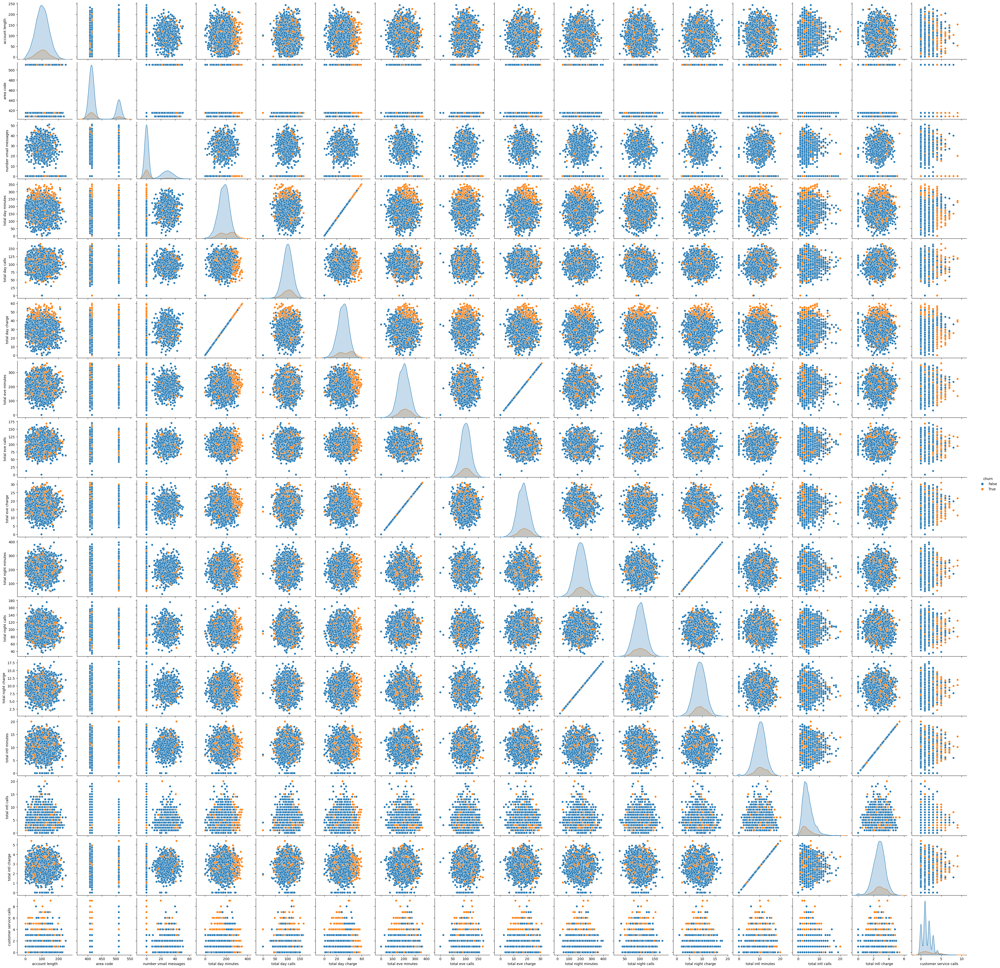

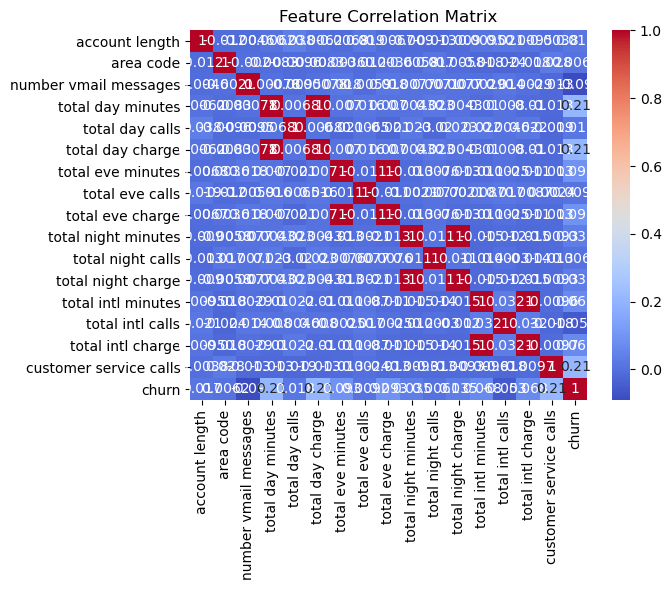

In [6]:
# Check data distributions
sns.pairplot(df, hue="churn", diag_kind="kde")
plt.show()

# Check correlations
correlation_matrix = df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm")
plt.title("Feature Correlation Matrix")
plt.show()

## Data Preparation

In [22]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder

# Handle outliers
for col in ["total day minutes", "total night minutes", "total intl minutes"]:
    q1 = df[col].quantile(0.25)
    q3 = df[col].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    df[col] = df[col].clip(lower=lower_bound, upper=upper_bound)

In [9]:
# Encode categorical variables
label_encoder = LabelEncoder()
df["international plan"] = label_encoder.fit_transform(df["international plan"])
df["voice mail plan"] = label_encoder.fit_transform(df["voice mail plan"])
df["churn"] = label_encoder.fit_transform(df["churn"])


In [15]:
# Split features and target
X = df.drop(columns=["churn", "state", "phone number"])
y = df["churn"]

# Scale numerical features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Modeling

In [16]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score

# Train a Random Forest model
model = RandomForestClassifier(random_state=42)
model.fit(X_train, y_train)

# Evaluate with cross-validation
scores = cross_val_score(model, X_train, y_train, cv=5, scoring="accuracy")
print(f"Cross-Validation Accuracy: {scores.mean():.2f}")

Cross-Validation Accuracy: 0.95


# Evaluation

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.99      0.97       566
           1       0.92      0.70      0.80       101

    accuracy                           0.95       667
   macro avg       0.94      0.85      0.88       667
weighted avg       0.95      0.95      0.94       667



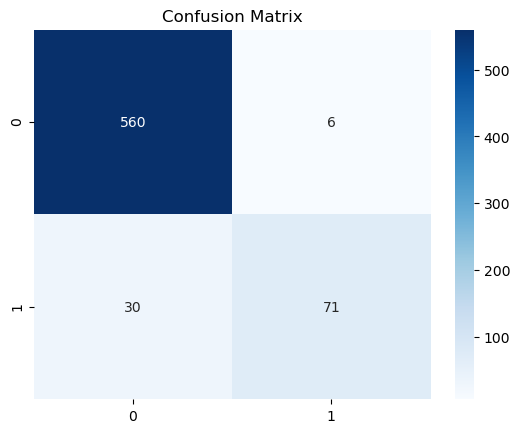

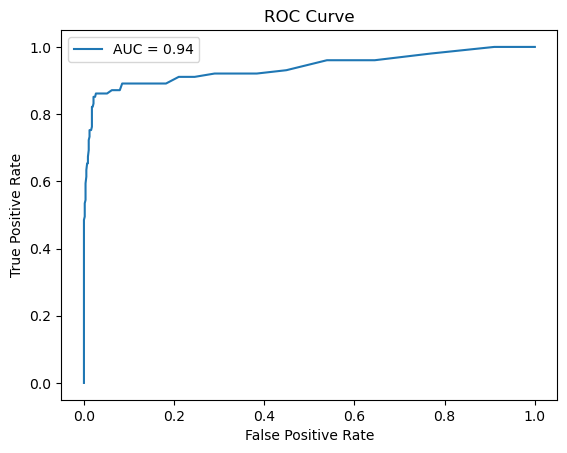

In [17]:
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve

# Predict on test data
y_pred = model.predict(X_test)
y_prob = model.predict_proba(X_test)[:, 1]

# Evaluation metrics
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.show()

# ROC Curve
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
plt.plot(fpr, tpr, label=f"AUC = {roc_auc_score(y_test, y_prob):.2f}")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.show()


# Deployment

In [20]:
import joblib

# Save the trained model
joblib.dump(model, "churn_model.pkl")
joblib.dump(scaler, "scaler.pkl")

# Load the model and scaler for inference
loaded_model = joblib.load("churn_model.pkl")
loaded_scaler = joblib.load("scaler.pkl")

# Example prediction# Replace these values with actual data for all 18 features, in the correct order
example_data = [[128, 415, 3624567, 0, 1, 0, 265.1, 110, 45.07, 99, 16.78, 244.7, 91, 11.01, 10.0, 3, 2.70, 1]]

# Ensure the data is scaled using the same scaler
example_data_scaled = loaded_scaler.transform(example_data)

# Predict churn
prediction = loaded_model.predict(example_data_scaled)
print("Churn Prediction:", "Yes" if prediction[0] else "No")


Churn Prediction: No
